In [1]:
%load_ext autoreload
%autoreload 2

import glob
import numpy as np
import pickle

import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import seaborn as sns 
import sys
import os
import json


[sys.path.append(f) for f in glob.glob('../utils/*')]
from preprocess import DATA_DIR, FIG_DIR
from plotting_utils import figSize
from session_utils import *
from recalibration_utils import *
from stabilizer_utils import Stabilizer
from sweep_utils import get_subsetDF

sessions_dir  = os.path.join(DATA_DIR, "T5/raw_data/one_month_recal")

sessions_dict = dict()
sessions_dict['t5.2022.06.08'] = {'stale' : [6, 8], 'stabilizer' : [7, 9], 'PRI-T' : [6, 8]} # day 0 - stale and PRI-T are the same
sessions_dict['t5.2022.06.13'] = {'stale' : [2, 5, 8], 'stabilizer' : [4, 7, 10], 'PRI-T' : [3, 6, 9]}
sessions_dict['t5.2022.06.15'] = {'stale' : [1, 4, 7, 10], 'stabilizer' : [3, 6, 9, 13], 'PRI-T' : [2, 5, 8, 11]}
sessions_dict['t5.2022.06.20'] = {'stale' : [1, 4, 7, 10], 'stabilizer' : [3, 6, 9, 12], 'PRI-T' : [2, 5, 8, 11]}
sessions_dict['t5.2022.06.22'] = {'stale' : [1, 4, 7, 10], 'stabilizer' : [3, 6, 9, 12], 'PRI-T' : [2, 5, 8, 11]}
sessions_dict['t5.2022.07.06'] = {'stale' : [1, 4, 7, 10], 'stabilizer' : [3, 6, 9, 12], 'PRI-T' : [2, 5, 8, 11]}


# holds ID/order of OL block from each session
OL_dict = dict()
OL_dict['t5.2022.06.08'] = 2
OL_dict['t5.2022.06.13'] = 0
OL_dict['t5.2022.06.15'] = 0
OL_dict['t5.2022.06.20'] = 0
OL_dict['t5.2022.06.22'] = 0
OL_dict['t5.2022.07.06'] = 0


# colors for plotting methods
colors   = {'PRI-T': 'deepskyblue', 'stabilizer' : 'orange', 'stale' : 'r'}
matplotlib.rcParams['font.family'] = ['sans serif'] # font

In [2]:

def loadPickleData(pkl_files):
    
    df_list = list()
    for file in pkl_files:
        with open(file, 'rb') as f:
            df = pickle.load(f)['task_df']
            df_list.append(df)
    
    return df_list
    

def getBootstrappedCIs(data, alpha, n_bootstraps = 10000):
    
    
    means = np.random.choice(data, (n_bootstraps, len(data)), replace = True).mean(axis = 1)

    upper = np.percentile(means, 100 - (alpha/2))
    lower = np.percentile(means, alpha/2)
    
    return lower, upper


def corrBootstrap(x, y, alpha, n_bootstraps = 10000):
    
    assert x.shape == y.shape, "must be same shape"
    
    idxs  = np.random.choice(x.shape[0], (n_bootstraps, x.shape[0]), replace = True)
    corrs = np.corrcoef(x[idxs].reshape(n_bootstraps, -1), y[idxs].reshape(n_bootstraps, -1))[:n_bootstraps, n_bootstraps:]
    corrs = np.diag(corrs)
    upper = np.percentile(corrs, 100 - (alpha/2))
    lower = np.percentile(corrs, alpha/2)
    
    return lower, upper


In [4]:
sessions_data = list()

counter = 0
for session, val in sessions_dict.items():
    session_path = os.path.join(sessions_dir, session, 'Data/TaskData/FittsTask/')
    
    print(f'Processing {session}')
    for method, blocks in val.items():
        files = [glob.glob(os.path.join(session_path, f'*block_{x}.pkl'))[0] for x in blocks]
        #print(method, files)
        
        datas = loadPickleData(files)
                
        for i, (dat, block) in enumerate(zip(datas, blocks)):
            
            trl_stops = np.where(dat['state'] >= 2)[0]
            
            # remove the first 60 seconds worth of trials (bias killer burn-in period)
            if i == 0:
                trl_stops = trl_stops[trl_stops * 0.02 > 60]
            
            trlens    = np.diff(trl_stops) * 0.02
            for_pd    = {'trialens' : trlens, 'method' : [method] * len(trlens), 
                         'block' : [block] * len(trlens), 'round' : [i] * len(trlens),
                         'absolute_block' : [counter + block] * len(trlens), 'date' : session}
            sessions_data.append(pd.DataFrame(for_pd))
    
    counter += 10
                             
sessions_data = pd.concat(sessions_data)

Processing t5.2022.06.08
Processing t5.2022.06.13
Processing t5.2022.06.15
Processing t5.2022.06.20
Processing t5.2022.06.22
Processing t5.2022.07.06


Plot raw data across all sessions:

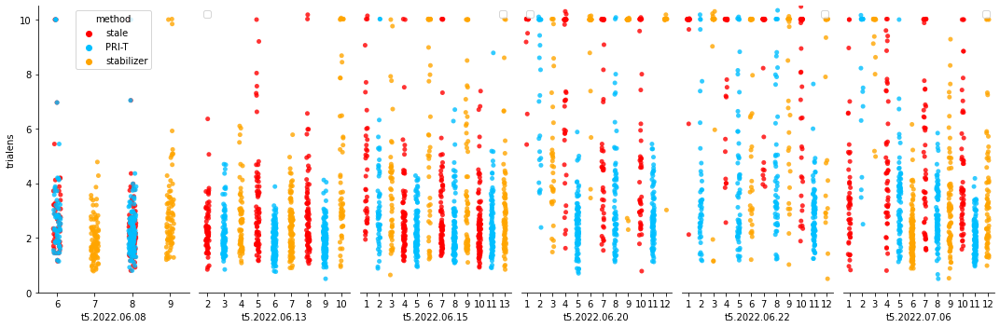

In [6]:
import matplotlib.font_manager

figSize(5, 15)

n_panels = len(sessions_dict.keys())

for i, session in enumerate(sessions_dict.keys()):
    session_subset = sessions_data[sessions_data['date'] == session]
    
    plt.subplot(1, n_panels, i + 1)
    plt.ylim([0, 10.5])
    sns.stripplot(data = session_subset, x = 'block', y = 'trialens', hue = 'method', palette = colors, alpha = 0.8)
    
    ax = plt.gca()
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xlabel(session)
    if i != 0:
        ax.spines["left"].set_visible(False)
        ax.set_yticks([])
        ax.set_ylabel(None)
        ax.legend([])
        
    plt.tight_layout()

Now plot bootstrapped mean estimates across time


----- t5.2022.06.08, PRI-T -----
0  | Mean ± SD =    3.073 ±    1.942
1  | Mean ± SD =    2.328 ±    1.168

----- t5.2022.06.08, stabilizer -----
0  | Mean ± SD =    1.985 ±    0.789
1  | Mean ± SD =    3.020 ±    1.744

----- t5.2022.06.08, stale -----
0  | Mean ± SD =    3.073 ±    1.942
1  | Mean ± SD =    2.328 ±    1.168

----- t5.2022.06.13, PRI-T -----
0  | Mean ± SD =    2.257 ±    0.869
1  | Mean ± SD =    1.880 ±    0.580
2  | Mean ± SD =    1.960 ±    0.639

----- t5.2022.06.13, stabilizer -----
0  | Mean ± SD =    2.637 ±    1.177
1  | Mean ± SD =    2.455 ±    0.986
2  | Mean ± SD =    4.470 ±    2.852

----- t5.2022.06.13, stale -----
0  | Mean ± SD =    2.374 ±    0.895
1  | Mean ± SD =    3.266 ±    1.882
2  | Mean ± SD =    2.935 ±    1.662

----- t5.2022.06.15, PRI-T -----
0  | Mean ± SD =    3.315 ±    1.841
1  | Mean ± SD =    2.232 ±    0.803
2  | Mean ± SD =    2.373 ±    1.095
3  | Mean ± SD =    2.445 ±    1.153

----- t5.2022.06.15, stabilizer -----
0  | Mean 

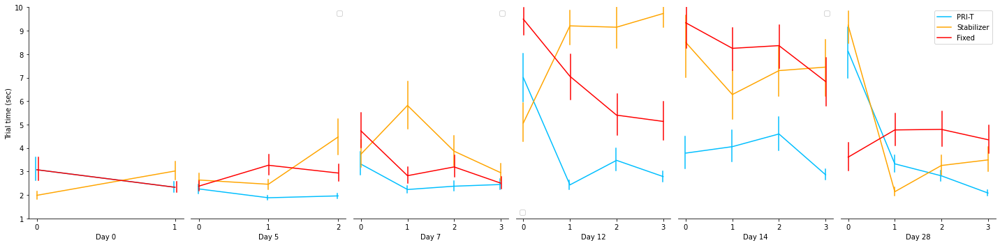

In [7]:
figSize(5, 20)

time_elapsed = [daysBetween('2022.06.08', x.split('t5.')[1]) for x in sessions_dict.keys()]
n_panels     = len(sessions_dict.keys())

for i, session in enumerate(sessions_dict.keys()):
    plt.subplot(1, n_panels, i + 1)
    plt.ylim([1, 10])
    for j, method in enumerate(np.unique(sessions_data['method'])):
        subset = get_subsetDF(sessions_data, query_dict = {'date' : session, 'method' : method})
        means  = list()

        print(f"\n----- {session}, {method} -----")
        for k, block in enumerate(np.unique(subset['absolute_block'])):
            trls_dat = subset.loc[subset['absolute_block'] == block, 'trialens']
            mean = trls_dat.mean()
            sd   = trls_dat.std()
            print(f"{k:<2} | Mean ± SD = {mean:8.3f} ± {sd:8.3f}")

            lower, upper = getBootstrappedCIs(trls_dat, alpha = 5, n_bootstraps = 10000)
            eps = (0.01 * (j - 1))        
            plt.plot([k + eps, k + eps], [lower, upper], c = colors[method])
            means.append(np.mean(trls_dat))
        plt.plot(means, c = colors[method])


    ax = plt.gca()
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xlabel('Day ' + str(time_elapsed[i]))
    ax.set_xticks(np.arange(len(means)))
    plt.ylabel('Trial time (sec)')

    if i != 0:
        ax.spines["left"].set_visible(False)
        ax.set_yticks([])
        ax.set_ylabel(None)
        ax.legend([])
        
    plt.tight_layout()
    

leg = plt.legend(['PRI-T', 'Stabilizer', 'Fixed'])
for i, c in enumerate(colors.values()):
    leg.legendHandles[i].set_color(c)

save_fname = os.path.join(FIG_DIR, 'comparisons/CL_trialtime')
plt.savefig(save_fname, format = 'pdf')

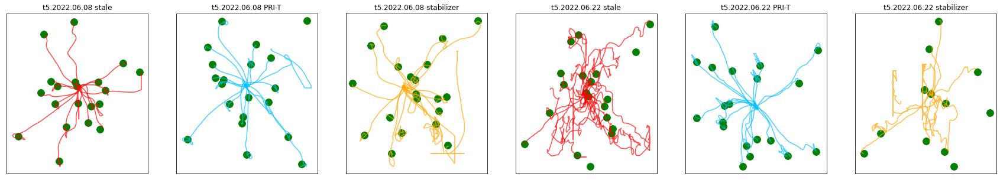

In [8]:
figSize(5, 30)
np.random.seed(42)


n_trls  = 20 # number of trials to plot for each panel

i = 0
for session in ['t5.2022.06.08', 't5.2022.06.22']:
    for method in ['stale', 'PRI-T', 'stabilizer']:
        plt.subplot(1, 6, i + 1)
        plt.title(session + ' ' + method)
        
        session_path = os.path.join(sessions_dir, session, 'Data/TaskData/FittsTask/')
        blocks       = [sessions_dict[session][method][-1]]
        files        = [glob.glob(session_path + f'*block_{x}.pkl')[0] for x in blocks]
        datas        = loadPickleData(files)[0]
        
        trls = sorted(np.where(datas['state'] == 2)[0])
        for trl in np.random.choice(len(trls) - 1, min(n_trls, len(trls) - 1), replace = False):
            start = trls[trl]
            stop  = trls[trl + 1]
            
            cursor   = np.vstack(datas['cursor_pos'][start:stop]) 
            target   = datas['target_pos'][start + 1]
            
            centering = np.copy(cursor[0, :]) 
            cursor   -= centering
            target   -= centering
            
            r = 0.1
            # radius in display coordinates:
            r_ = ax.transData.transform([r,0])[0] - ax.transData.transform([0,0])[0]
            # marker size as the area of a circle
            marker_size = np.pi * r_**2
            
            plt.plot(cursor[:, 0], cursor[:, 1], color = colors[method], alpha = 0.7)
            plt.scatter(target[0], target[1], c = 'g', s = marker_size,)
            plt.xticks([])
            plt.yticks([])

        i += 1
        
save_fname = os.path.join(FIG_DIR, 'comparisons/CL_exampleTrajs')
plt.savefig(save_fname, format = 'pdf')
plt.show()

Now measure correlation with ground-truth on OL blocks within day:
    

In [10]:
import re 
import stabilizer # pickled stabilize objects from rig codebase - so need to load this in for pickle to load 

def loadDecoder(session_path, method, blocks):
    decoder_path = os.path.join(session_path.split('/TaskData')[0], 'Decoders/Fitts/')
    
    convert_to_path_part = {'stale' : 'supervised', 'stabilizer' : 'stabilized', 'PRI-T' : 'PRIT'}
    
    pat       = '\d\d\d\d\.\d\d\.\d\d'
    curr_date = re.findall(pat, session_path)[0].replace('.', '-')
        
    if curr_date == '2022-06-08':
        if method == 'stale' or method == 'PRI-T':
            decoder_files = glob.glob(decoder_path + '2022-06-08*supervised*')
        else:
            decoder_files  = glob.glob(decoder_path + '2022-06-08*block_2*supervised*')
            decoder_files += glob.glob(decoder_path + '2022-06-08*' + convert_to_path_part[method] + '*')
        decoder_files.sort(key = lambda x: int(re.search('block_\d', x).group(0).split('_')[1]))

    else:
        if method == 'stale':
            # if stale, just load the 06/08/2022 decoder file from the folder and use it for all blocks
            decoder_files = glob.glob(decoder_path + '2022-06-08*' + convert_to_path_part[method] + '*')
            decoder_files = np.repeat(decoder_files, len(blocks))

        else:

            # find initial decoder that was trained during previous session
            initial = glob.glob(decoder_path  + f'*{convert_to_path_part[method]}*')
            initial = [x for x in initial if curr_date not in x]
            initial = [x for x in initial if '2022-06-08' not in x]
            
            if curr_date == '2022-06-13':
                if method == 'PRI-T':
                    initial = glob.glob(decoder_path  + f'2022-06-08*block_3*supervised*')
                else:
                    initial = glob.glob(decoder_path  + f'2022-06-08*block_3*{convert_to_path_part[method]}*')

            # find rest of decoders trained on current session blocks
            rest = glob.glob(decoder_path  + curr_date + f'*{convert_to_path_part[method]}*')
            rest.sort(key = lambda x: int(re.search('block_\d', x).group(0).split('_')[1]))

            decoder_files = initial + rest
        
        
    decoders = list()
    print(decoder_files)
    for x in decoder_files:
        lm       = LinearRegression()
        weights  = pickle.load(open(x, 'rb'))
        lm.coef_      = weights['coefs']
        lm.intercept_ = weights['bias']
        
        decoders.append(lm)
        
    return decoders
        


In [11]:
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from CosineTuning import angle_between
from firingrate import gaussian_filter1d
import warnings

OL_datas = dict()

print('Getting OL data...')
for session, val in OL_dict.items():
    session_path = os.path.join(sessions_dir, session, 'Data/TaskData/FittsTask/')
    
    print(session)
    OL_file = glob.glob(session_path + f'*block_{val}*')[0]
    OL_data = loadPickleData([OL_file])
        
    OL_datas[session] = OL_data[0]
    
    #break
    
print('\n Getting decoders...')
decoders_dict = dict()
angles_df     = pd.DataFrame()

for session, val in sessions_dict.items():
    session_path = os.path.join(sessions_dir, session, 'Data/TaskData/FittsTask/')
    
    print('\n')
    print(session)
    decoders_dict[session] = dict()
        
    for method, blocks in val.items():
        #print(method)
        data_files = [glob.glob(session_path + f'*block_{x}.pkl')[0] for x in blocks]      
        datas      = loadPickleData(data_files)
        decoders   = loadDecoder(session_path, method, blocks)         
                
        for i, (dat, block, lm) in enumerate(zip(datas, blocks, decoders)):
            decoders_dict[session][block] = [method, lm, i]
            

Getting OL data...
t5.2022.06.08
t5.2022.06.13
t5.2022.06.15
t5.2022.06.20
t5.2022.06.22
t5.2022.07.06

 Getting decoders...


t5.2022.06.08
['/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.08/Data/Decoders/Fitts/2022-06-08_block_2_decoder_supervised.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.08/Data/Decoders/Fitts/2022-06-08_block_3_decoder_supervised.pkl']
['/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.08/Data/Decoders/Fitts/2022-06-08_block_2_decoder_supervised.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.08/Data/Decoders/Fitts/2022-06-08_block_3_decoder_stabilized.pkl']


/home/users/ghwilson/.local/lib/python3.9/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator FactorAnalysis from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


['/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.08/Data/Decoders/Fitts/2022-06-08_block_2_decoder_supervised.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.08/Data/Decoders/Fitts/2022-06-08_block_3_decoder_supervised.pkl']


t5.2022.06.13
['/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.13/Data/Decoders/Fitts/2022-06-08_block_2_decoder_supervised.pkl'
 '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.13/Data/Decoders/Fitts/2022-06-08_block_2_decoder_supervised.pkl'
 '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.13/Data/Decoders/Fitts/2022-06-08_block_2_decoder_supervised.pkl'
 '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.06.13/Data/Decoders/Fitts/2022-06-08_block_3_decoder_supervised.pkl'
 '/oak/stanford/groups/hender

['/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.07.06/Data/Decoders/Fitts/2022-06-22_block_9_decoder_stabilized.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.07.06/Data/Decoders/Fitts/2022-07-06_block_3_decoder_stabilized.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.07.06/Data/Decoders/Fitts/2022-07-06_block_6_decoder_stabilized.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.07.06/Data/Decoders/Fitts/2022-07-06_block_9_decoder_stabilized.pkl']
['/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.07.06/Data/Decoders/Fitts/2022-06-22_block_8_decoder_PRIT.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/raw_data/one_month_recal/t5.2022.07.06/Data/Decoders/Fitts/2022-07-06_block_2_decoder_PRIT.pkl', '/oak/stanford/groups/henderj/ghwilson/PRITpaper2025/T5/

OL block correlations:

NameError: name 'fig_path' is not defined

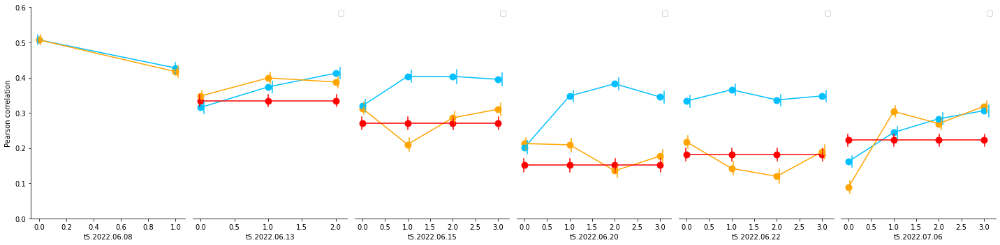

In [22]:
figSize(5, 20)

n_panels = len(sessions_dict.keys())
corrs_df = pd.DataFrame()

for i, (session, session_data) in enumerate(OL_datas.items()):
    x = np.vstack(session_data['neural'])
    y = np.vstack(session_data['target_pos']) - np.vstack(session_data['cursor_pos'])

    plt.subplot(1, n_panels, i + 1)
    plt.ylim([0., 0.6])
    
    plot_x = dict({'PRI-T' : [], 'stabilizer' : [], 'stale' : []})
    plot_y = dict({'PRI-T' : [], 'stabilizer' : [], 'stale' : []})
    
    for j, block in enumerate(decoders_dict[session].keys()):
        method    = decoders_dict[session][block][0]
        lm        = decoders_dict[session][block][1]
        round_num = decoders_dict[session][block][2]
        
        # get overall OL correlation
        preds        = lm.predict(x)
        pearson_r    = np.corrcoef(preds.flatten(), y.flatten())[0, 1]
        lower, upper = corrBootstrap(preds, y, alpha = 5)

        plot_x[method].append(round_num)
        plot_y[method].append(pearson_r)
        
        with warnings.catch_warnings():
                warnings.simplefilter(action='ignore', category=FutureWarning)
                corrs_df = corrs_df.append({'session' : session, 'method': method, 'block': round_num,
                                              'corr' : pearson_r }, ignore_index = True) 
                
        plt.scatter(round_num, pearson_r, c = colors[method], s = 80)
        eps = (0.01 * (j - 1)) # add a little jitter so CIs arent over each other
        plt.plot([round_num + eps, round_num + eps], [lower, upper], c = colors[method])
            
    for key in plot_x.keys():
        plt.plot(plot_x[key], plot_y[key], c = colors[key])
                        
            
    ax = plt.gca()
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xlabel(session)
    if i != 0:
        ax.spines["left"].set_visible(False)
        ax.set_yticks([])
        ax.set_ylabel(None)
        ax.legend([])
    if i == 0:
        plt.ylabel('Pearson correlation')
    plt.tight_layout()
    
    
save_fname = os.path.join(FIG_DIR, 'comparisons/CL_OLcorrelations')
plt.savefig(save_fname, format = 'pdf')

In [27]:
diffs = list()
relative = list()
for session in ['t5.2022.06.15', 't5.2022.06.20', 't5.2022.06.22']:
    prit_scores = get_subsetDF(corrs_df, query_dict = {'session' : session, 'method' : 'PRI-T'}).set_index("block")
    fa_scores   = get_subsetDF(corrs_df, query_dict = {'session' : session, 'method' : 'stabilizer'}).set_index("block")
    
    diffs.extend(prit_scores['corr'] - fa_scores['corr'])
    relative.extend((prit_scores['corr'] - fa_scores['corr']) / fa_scores['corr'])
    
print('Difference (mean ± SD): {:.2f} ± {:.2f}'.format(np.mean(diffs), np.std(diffs)))
print('Relative difference (mean ± SD): {:.2f} ± {:.2f}'.format(np.mean(relative), np.std(relative)))

Difference (mean ± SD): 0.14 ± 0.08
Relative difference (mean ± SD): 0.81 ± 0.62


Visualize PRI-T inferences as heatmap across time:

In [15]:
def getTargetGrid(screen_lims, gridSize, task = None):
    '''Divide screen into a n x n grid of possible target locations. Inputs are: 

    screen_lims (list)  - [x_min, x_max, y_min, y_max]
    gridSize (int)      - number of rows and columns to chop the screen up into 
    task (str)          - task data to draw from; defaults to using all 

    TODO: update to work with new getTrainTest outputs, also deal with screen shifting around for different blocks
    '''


    X_min, X_max  = screen_lims[0], screen_lims[1]
    Y_min, Y_max  = screen_lims[2], screen_lims[3]

    X_loc,Y_loc   = np.meshgrid(np.linspace(X_min, X_max, gridSize), np.linspace(Y_min, Y_max, gridSize))
    targLocs      = np.vstack([np.ravel(X_loc), np.ravel(Y_loc[:])]).T

    return targLocs

In [16]:
file = '/oak/stanford/groups/shenoy/ghwilson/sessions/t5/t5.2022.06.22/Data/TaskData/FittsTask/2022-06-22_block_11.pkl'
data = loadPickleData([file])[0]

targetpos = np.vstack(data['target_pos'])
cursorpos = np.vstack(data['cursor_pos'])
cursorvel = np.vstack(data['cursor_vel'])

In [23]:
import hmm
import hmm_utils

# offline sweep optimal 
stayProb      = 0.999
gridSize      = 20
vmKappa       = 2
inflection    = 0.35
exp           = 0.5

#---------------------------------------------
targLocs                = getTargetGrid([-1, 1, -1, 1], gridSize = gridSize)
stateTrans, pStatestart = hmm_utils.generateTransitionMatrix(gridSize, stayProb)

adjustKappa  = lambda dist: 1 / (1 + np.exp(-1 * (dist - inflection) * exp))
model        = hmm.HMMRecalibration(stateTrans, targLocs, pStateStart, vmKappa, adjustKappa)

targStates = model.viterbi_search(cursorvel, cursorpos)[0]
pTargState = model.decode(cursorvel, cursorpos)[0]


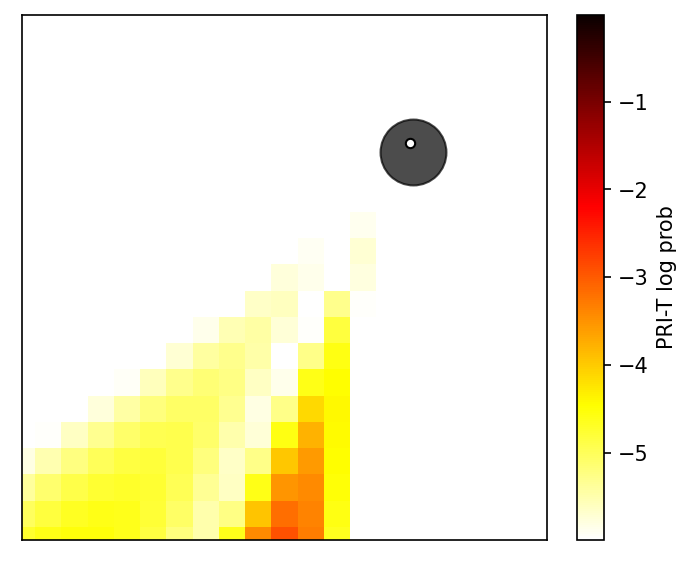

In [24]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable


file = '/oak/stanford/groups/shenoy/ghwilson/sessions/t5/t5.2022.06.22/Data/TaskData/FittsTask/2022-06-22_block_11.pkl'
data = loadPickleData([file])[0]


figSize(5, 5)
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
#plt.ioff()
fig = plt.figure()

marker_size = 20
cursor_color = 'white'
target_color = 'k'
cmap         = 'hot_r'
toggle_log   = True



def get_data(t):
    cursor = (cursorpos[t, :] - np.min(targLocs, axis = 0)) / (np.max(targLocs, axis = 0) - np.min(targLocs, axis = 0))
    cursor *= 20
    cursor = np.maximum(cursor, 0)
    cursor = np.minimum(cursor, 20)
    
    target = (targetpos[t, :] - np.min(targLocs, axis = 0)) / (np.max(targLocs, axis = 0) - np.min(targLocs, axis = 0))
    target *= 20
    target = np.maximum(target, 0)
    target = np.minimum(target, 20)
    
    if toggle_log:
        probs = np.log(pTargState[:, t].reshape(20, 20))

    else:
        probs = pTargState[:, t].reshape(20, 20)
    
    return cursor, target, probs


cursor, target, probs = get_data(0)


if toggle_log:
    vmin  = np.log(0.0025)
    vmax  = np.log(0.99)
else:
    vmin  = 0
    vmax  = 0.99   

im     = plt.imshow(probs, cmap = cmap, vmin = vmin, vmax = vmax)

targ   = plt.scatter(target[0], target[1], c = target_color, s = marker_size * 50, alpha = 0.7)
curs   = plt.scatter(cursor[0], cursor[1], c = cursor_color, s = marker_size, edgecolors = 'k')

plt.xlim(0, 20)
plt.ylim(0, 20)

ax     = plt.gca()

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.2)
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('PRI-T log prob')

ax.set_yticks([])
ax.set_xticks([])


def animateinit(): #tells our animator what artists will need re-drawing every time
    return [im, targ, curs]

def animate(t):
    idx    = t + 6000
    
    cursor, target, probs = get_data(idx)
    
    #plt.cla()
    im.set_array(probs)
    targ.set_offsets(np.c_[target[0], target[1]])
    curs.set_offsets(np.c_[cursor[0], cursor[1]])

    return [im, targ, curs]


anim = matplotlib.animation.FuncAnimation(fig, animate, init_func = animateinit, 
                                          frames=1000, interval = 20, blit = True)
anim
#anim.save('../figures/HMM/PRIT_example.mp4')

Human intracortical BMI robustness records:

[Jarosiewicz et al., 2016](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5591042/pdf/nihms865222.pdf) - 28 days; click + cursor decoder

[Qi et al., 2022](https://arxiv.org/pdf/2204.11840.pdf) - 5 days; cursor decoder

ECoG:

[Silversmith et al., 2021](https://www-nature-com.stanford.idm.oclc.org/articles/s41587-020-0662-5) - 36 days; cursor decoder

[Blakeley et al., 2009](https://www.researchgate.net/profile/Stavros-Zanos/publication/26333580_Robust_long-term_control_of_an_electrocorticographic_brain-computer_interface_with_fixed_parameters/links/0fcfd511afc51c7447000000/Robust-long-term-control-of-an-electrocorticographic-brain-computer-interface-with-fixed-parameters.pdf?origin=publication_detail) - 5 days; cursor decoder (w/ really large targets)